## Data Processing

### Inputing the data

In [26]:
# Required Modules
import pandas as pd
import numpy as np
from tqdm import tqdm

In [2]:
# Load the data
data = pd.read_csv('data/clustering_data.csv')

/tmp/ipykernel_46601/3817769316.py:2: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('data/clustering_data.csv')


### Checking the data

In [3]:
# check the first few rows of the data
data.head()

,CircleName,RegionName,DivisionName,OfficeName,Pincode,OfficeType,Delivery,District,StateName,Latitude,Longitude
0,Andhra Pradesh Circle,Kurnool Region,Hindupur Division,Peddakotla B.O,515631,BO,Delivery,ANANTAPUR,ANDHRA PRADESH,14.5689,77.85624
1,Andhra Pradesh Circle,Kurnool Region,Hindupur Division,Pinnadhari B.O,515631,BO,Delivery,ANANTAPUR,ANDHRA PRADESH,14.5281,77.857014
2,Andhra Pradesh Circle,Kurnool Region,Hindupur Division,Yerraguntapalle B.O,515631,BO,Delivery,ANANTAPUR,ANDHRA PRADESH,14.561111,77.85715
3,Andhra Pradesh Circle,Kurnool Region,Hindupur Division,Obulareddipalli B.O,515581,BO,Delivery,ANANTAPUR,ANDHRA PRADESH,14.2488,78.2588
4,Andhra Pradesh Circle,Kurnool Region,Hindupur Division,Odulapalli B.O,515581,BO,Delivery,ANANTAPUR,ANDHRA PRADESH,14.24555,78.2477


In [4]:
data.shape

(157126, 11)

### Filtering the data of my state

In [5]:
# Drop the rows with state not maharashtra
data.drop(data[data['StateName'] != 'MAHARASHTRA'].index, inplace=True)


In [6]:
data.head(10)

,CircleName,RegionName,DivisionName,OfficeName,Pincode,OfficeType,Delivery,District,StateName,Latitude,Longitude
934,Maharashtra Circle,Nagpur Region,Amaravati Division,Bhatkuli S.O,444602,PO,Non Delivery,AMRAVATI,MAHARASHTRA,20.907,77.6026
37630,Maharashtra Circle,Nagpur Region,Chandrapur Division,Subai B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.5733438,79.4422593
37631,Maharashtra Circle,Nagpur Region,Chandrapur Division,Tembhuwahi B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.6924335,79.3571161
37632,Maharashtra Circle,Nagpur Region,Chandrapur Division,Vihirgaon B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.7268087,79.453512
38709,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Nilegaon B.O,413603,BO,Delivery,OSMANABAD,MAHARASHTRA,18.010041,76.0710641
38710,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Omerga Chivari B.O,413603,BO,Delivery,OSMANABAD,MAHARASHTRA,18.010041,76.0710641
38711,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Shahapur B.O,413603,BO,Delivery,OSMANABAD,MAHARASHTRA,18.010041,76.0710641
38712,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Sukta B.O,413504,BO,Delivery,OSMANABAD,MAHARASHTRA,18.4495119,75.6758187
38713,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Uloop B.O,413504,BO,Delivery,OSMANABAD,MAHARASHTRA,18.4495119,75.6758187
38714,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Walwad B.O,413504,BO,Delivery,OSMANABAD,MAHARASHTRA,18.4495119,75.6758187


In [7]:
print(data.shape)

(12756, 11)


In [8]:
# Check for missing longitudes
missing_longitudes = data['Longitude'].isnull().sum()

# Check for missing latitudes
missing_latitudes = data['Latitude'].isnull().sum()

print(f'Missing longitudes: {missing_longitudes}')
print(f'Missing latitudes: {missing_latitudes}')

data.dropna(subset=['Longitude', 'Latitude'], inplace=True)

Missing longitudes: 772
Missing latitudes: 772


In [11]:
def clean_coordinate(value):
    try:
        # Remove any trailing characters that are not digits or decimal points
        value = value.rstrip('-')
        # Convert to float
        return float(value)
    except ValueError:
        print(f'Could not convert {value} to float')
        # If conversion fails, return None (or you can choose to handle it differently)
        return None

data['Latitude'] = data['Latitude'].astype(str).apply(clean_coordinate)
data['Longitude'] = data['Longitude'].astype(str).apply(clean_coordinate)

print(data.shape)

(11983, 11)


In [12]:
# print all the data whihc are not in certain longitude and latitude range
data.drop(data[(data['Longitude'] < 72.36) | (data['Longitude'] > 80.54)].index, inplace=True)
data.drop(data[(data['Latitude'] < 15.35) | (data['Latitude'] > 22.02)].index, inplace=True)

In [13]:
print(data.shape)

(11525, 11)


### Plot the points with longitude and latitude

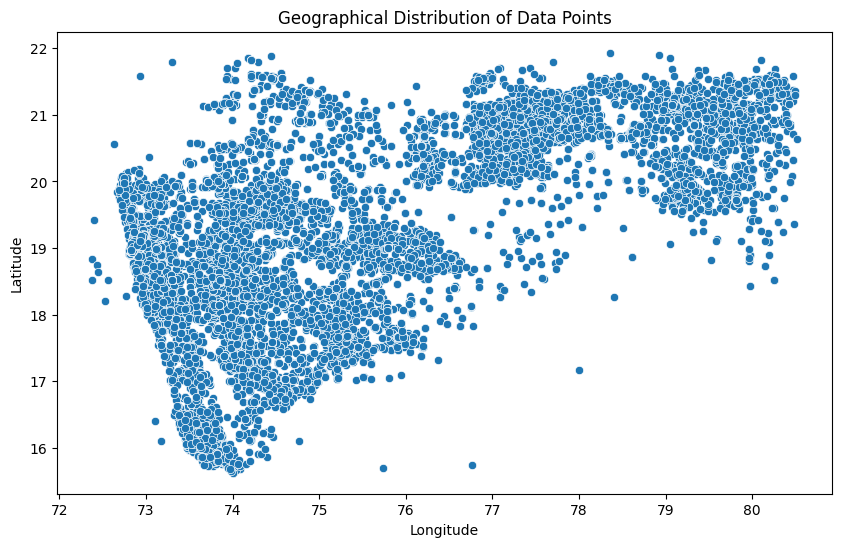

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='Longitude', y='Latitude')
plt.title('Geographical Distribution of Data Points')
plt.show()

In [14]:
import folium
from folium.plugins import MarkerCluster


# Create a base map
m = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=6)

# Add a marker cluster to the map
marker_cluster = MarkerCluster().add_to(m)

# Add points to the map
for idx, row in data.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']], popup=row['Pincode']).add_to(marker_cluster)

# Save the map to an HTML file
m.save('pincode_map.html')

# Optionally display the map in a Jupyter notebook (uncomment if using Jupyter)
m


## K-means model

### kmeans model

In [16]:
import numpy as np

In [17]:
class Kmeans():
    def __init__(self, k = 3, tolerance = 0.001, max_iterations = 500):
        self.k = k
        self.tolerance = tolerance
        self.max_iterations = max_iterations

    def euclidean_distance(self, x, y):
        return np.linalg.norm(x - y, axis=0)
    
    def fit(self, data, centroid_init = 'firstk'):
        # Selecting centroids as first k elements
        self.centroids = {}
        if centroid_init == 'random':
            for i in range(self.k):
                self.centroids[i] = data[np.random.randint(0, len(data))]
        elif centroid_init == 'firstk':
            for i in range(self.k):
                self.centroids[i] = data[i]
        
        # The main loop which will keep updating the centroids
        for i in range(self.max_iterations):

            # intializing the clusters
            self.clusters = {}
            for j in range(self.k):
                self.clusters[j] = []

            # Adding points to the clusters according to min euclidean distance
            for point in data:
                # distances = []
                # for index in self.centroids:
                #     distances.append(self.euclidean_distance(point, self.centroids[index]))
                distances = [self.euclidean_distance(point, self.centroids[index]) for index in self.centroids]
                cluster = distances.index(min(distances))
                self.clusters[cluster].append(point)

            # Updating the centroids
            prev_centroids = dict(self.centroids)
            for index in self.centroids:
                self.centroids[index] = np.average(self.clusters[index], axis=0)
            
            # Checking the tolerance
            isOptimal = True
            for index in self.centroids:
                original_centroid = prev_centroids[index]
                new_centroid = self.centroids[index]
                if(np.sum((new_centroid - original_centroid)/original_centroid*100.0) > self.tolerance):
                    isOptimal = False
            # print(i)            
            if isOptimal:
                break
    
    def predict(self, point):
        distances = [self.euclidean_distance(point, self.centroids[index]) for index in self.centroids]
        cluster_index = distances.index(min(distances))
        return cluster_index
            


### Transforming the data to fit in the model

In [24]:
final_df = data[['Longitude', 'Latitude']].values
print(final_df.shape)

(11525, 2)


### Finding optimum k with elbow method

/home/shravan/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/shravan/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


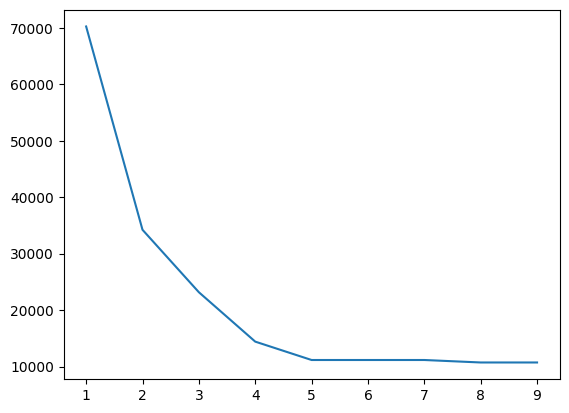

In [22]:
# find the optimum k by elbow method

costs = []
for i in range(1,10):
    kmeans = Kmeans(k=i)
    kmeans.fit(final_df)
    cost = 0
    for j in range(i):
        cost += np.sum((np.array(kmeans.clusters[j]) - kmeans.centroids[j])**2)
    costs.append(cost)

plt.plot(range(1,10), costs)
plt.show()

[74.10029255 19.97858198]
[79.40913912 20.61510473]
[76.27775768 18.68234829]
[77.1627981  20.63759074]
[73.9302377  17.51617303]


100%|██████████| 5/5 [08:26<00:00, 101.38s/it]


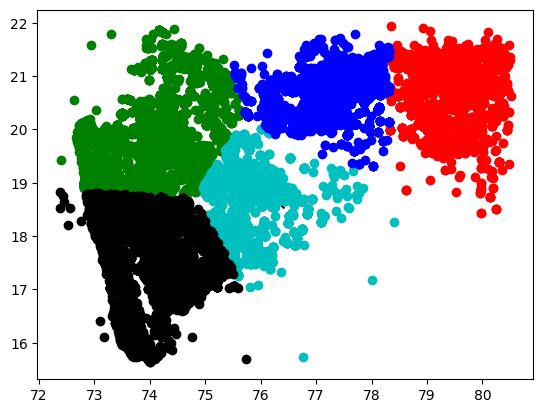

In [27]:
kmeans = Kmeans(k=5)
kmeans.fit(final_df)

for index in kmeans.centroids:
    print(kmeans.centroids[index])

fig = plt.figure()
ax = fig.add_subplot()

colors = 10*["g","r","c","b","k"]
for index in tqdm(kmeans.centroids):
    ax.scatter(kmeans.centroids[index][0], kmeans.centroids[index][1], s=130, color='k', marker='x')
    for point in tqdm(kmeans.clusters[index]):
        ax.scatter(point[0], point[1], color=colors[index])